# DESIGN

# Imports

In [1]:
# Standard libraries

import pickle
import sys                                    # Required to import my libraries.
from typing import Dict, List, Union, Tuple

# Third-party libraries

from IPython.display import display           # display(df) prints large DataFrames in nice table format.
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# My libraries

sys.path.insert(0, "../src")
from bikesharing import *


# Global Variables

In [2]:
file_data = "../data/hour.csv"
model_file = "model.pkl"

# Data Loader

In [3]:
dl = DataLoader()
df_data = dl.load(file_data)

display(df_data)


,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


# Data Pre-Processor

In [4]:
# Derive mean and std of numerical features
#  - values from the training dataset
#  - reused in Data Pre-Processor
#  - values are used to define global variables MEANS and STDS in bikesharing.py

display(df_data[:-(60+21)*24].describe())


,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000,15435.000000
mean,7718.000000,2.363848,0.439909,5.959054,11.542468,0.027794,2.998704,0.684678,1.418400,0.513002,0.489545,0.626437,0.190757,36.329316,150.004470,186.333787
std,4455.845038,1.038105,0.496392,3.200486,6.914034,0.164387,2.004045,0.464659,0.642335,0.194913,0.173871,0.195437,0.122189,49.586925,148.052465,179.023641
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3859.500000,1.000000,0.000000,3.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.360000,0.348500,0.470000,0.104500,4.000000,34.000000,39.500000
50%,7718.000000,2.000000,0.000000,6.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.540000,0.500000,0.630000,0.194000,17.000000,112.000000,139.000000
75%,11576.500000,3.000000,1.000000,9.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.790000,0.253700,50.000000,215.000000,276.000000
max,15435.000000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


In [5]:
# Initialize data pre-processor    

dpp = DataPreprocessor(MEANS, STDS)
df_features, df_targets = dpp.run(df_data, targets=True)

print("FEATURES (AFTER PREPROCESSING)")
print()

display(df_features)

print("TARGETS (AFTER PREPROCESSING)")
print()

display(df_targets)


FEATURES (AFTER PREPROCESSING)



,holiday,hr_0,hr_1,hr_10,hr_11,hr_12,hr_13,hr_14,hr_15,hr_16,...,weathersit_4,weekday_0,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,windspeed,yr
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,-1.565574,0
1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,-1.565574,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,-1.565574,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,-1.565574,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,-1.565574,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,-0.219672,1
17375,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,-0.219672,1
17376,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,-0.219672,1
17377,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,-0.464754,1


TARGETS (AFTER PREPROCESSING)



,cnt
0,-0.951464
1,-0.817403
2,-0.862090
3,-0.968222
4,-1.035252
...,...
17374,-0.376119
17375,-0.543696
17376,-0.538110
17377,-0.700100


In [6]:
# List of all features in pre-processed data
# (reused in the DataPreprocessor.order_features() method)

list_features_ordered = list(df_features.columns)
list_features_ordered.sort()

print(list_features_ordered)


['holiday', 'hr_0', 'hr_1', 'hr_10', 'hr_11', 'hr_12', 'hr_13', 'hr_14', 'hr_15', 'hr_16', 'hr_17', 'hr_18', 'hr_19', 'hr_2', 'hr_20', 'hr_21', 'hr_22', 'hr_23', 'hr_3', 'hr_4', 'hr_5', 'hr_6', 'hr_7', 'hr_8', 'hr_9', 'hum', 'mnth_1', 'mnth_10', 'mnth_11', 'mnth_12', 'mnth_2', 'mnth_3', 'mnth_4', 'mnth_5', 'mnth_6', 'mnth_7', 'mnth_8', 'mnth_9', 'season_1', 'season_2', 'season_3', 'season_4', 'temp', 'weathersit_1', 'weathersit_2', 'weathersit_3', 'weathersit_4', 'weekday_0', 'weekday_1', 'weekday_2', 'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6', 'windspeed', 'yr']


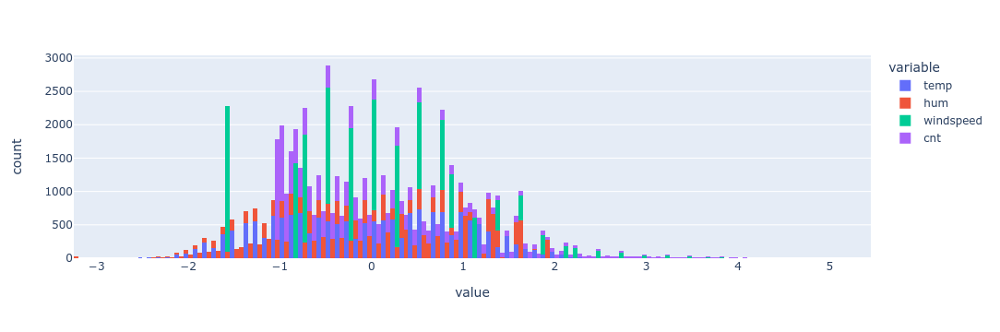

In [7]:
# Sanity check: scatter charts of scaled features
#
# Values should be centered around 0 with most values between -1 and 1

fts = dpp.features_scale
df = pd.concat([df_features[fts], df_targets], axis=1)
fig = px.histogram(df)
fig.show()


# Neural Network

In [8]:
# Sanity check
#
# Below is a sanity check provided by Udacity for testing
# the neural network.

# Inputs / targets for check
inputs = np.array([[0.5, -0.2, 0.1]])
targets = np.array([[0.4]])

# Initial weights for check
test_w_i_h = np.array([[0.1, -0.2],
                       [0.4, 0.5],
                       [-0.3, 0.2]])
test_w_h_o = np.array([[0.3],
                       [-0.1]])

# Neural network architecture for check
nn = NeuralNetwork(3, 2, 1, 0.5)
nn.weights_input_to_hidden = test_w_i_h.copy()
nn.weights_hidden_to_output = test_w_h_o.copy()

# Test - NeuralNetwork.run()
#
# Expected output:
#
#     predictions = 0.09998924

predictions = nn.run(inputs)
print(predictions)

# Test - NeuralNetwork.train()
#
# Expected weights after 1 pass:
#
#     weights_hidden_to_output: [[ 0.37275328]
#                                [-0.03172939]]
#
#     weights_input_to_hidden: [[ 0.10562014 -0.20185996]
#                               [ 0.39775194  0.50074398]
#                               [-0.29887597  0.19962801]]

nn.train(inputs, targets)

print()
print(nn.weights_hidden_to_output)
print()
print(nn.weights_input_to_hidden)


[[0.09998924]]

[[ 0.37275328]
 [-0.03172939]]

[[ 0.10562014 -0.20185996]
 [ 0.39775194  0.50074398]
 [-0.29887597  0.19962801]]


# Training

### Datasets

In [9]:
# Train-valid-test dataset split

def split_train_valid_test(df_features: pd.DataFrame,  # Features
                           df_targets: pd.DataFrame,   # Targets     
                           valid_days: float,          # Days in validation dataset
                           test_days: float            # Days in test dataset
                          ) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame] :  

    # Training dataset
    
    df_train_features = df_features[:-(valid_days+test_days)*24]
    df_train_targets  = df_targets[:-(valid_days+test_days)*24]

    # Validation dataset

    df_valid_features = df_features[-(valid_days+test_days)*24:-test_days*24]
    df_valid_targets  = df_targets[-(valid_days+test_days)*24:-test_days*24]
    
    # Train / valid split
    
    df_test_features = df_features[-test_days*24:]
    df_test_targets  = df_targets[-test_days*24:]
    
    return df_train_features, df_valid_features, df_test_features, df_train_targets, df_valid_targets, df_test_targets


df_train_features, df_valid_features, df_test_features, \
df_train_targets, df_valid_targets, df_test_targets = split_train_valid_test(df_features, df_targets, 60, 21)


In [10]:
# Sanity check: print datasets shapes

print("df_features.shape: ",  df_features.shape)
print("df_targets.shape:   ", df_targets.shape)
print()
print("df_train_features.shape: ", df_train_features.shape)
print("df_valid_features.shape: ", df_valid_features.shape)
print("df_test_features.shape: ",  df_test_features.shape)
print()
print("df_train_targets.shape: ", df_train_targets.shape)
print("df_valid_targets.shape: ", df_valid_targets.shape)
print("df_test_targets.shape: ", df_test_targets.shape)


df_features.shape:  (17379, 56)
df_targets.shape:    (17379, 1)

df_train_features.shape:  (15435, 56)
df_valid_features.shape:  (1440, 56)
df_test_features.shape:  (504, 56)

df_train_targets.shape:  (15435, 1)
df_valid_targets.shape:  (1440, 1)
df_test_targets.shape:  (504, 1)


In [11]:
# Print dataset statistics

def print_dataset_statistics(df_train: pd.DataFrame,
                             df_valid: pd.DataFrame,
                             df_test: pd.DataFrame) -> None:
    """Print number of data points in train/valid/test datasets."""

    n_train = len(df_train)
    n_valid = len(df_valid)
    n_test = len(df_test)

    n_tot = n_train + n_valid + n_test

    d = dict()
    d["datasets"]    = ["train", "valid", "test", "-", "total"]
    d["data_points"] = [n_train, n_valid, n_test, "-", n_tot]
    d["%_total"]     = [format(100*n_train/n_tot, ".2f"),
                        format(100*n_valid/n_tot, ".2f"),
                        format(100*n_test/n_tot, ".2f"),
                        "-",
                        format(100*n_tot/n_tot, ".2f")]

    df = pd.DataFrame(d)

    print(df.to_markdown(index=False))

print_dataset_statistics(df_train_features, df_valid_features, df_test_features)

| datasets   | data_points   | %_total   |
|:-----------|:--------------|:----------|
| train      | 15435         | 88.81     |
| valid      | 1440          | 8.29      |
| test       | 504           | 2.90      |
| -          | -             | -         |
| total      | 17379         | 100.00    |


### Hyperparameter Search

In [12]:
# Hyperparameters

# Constant hyperparameters

input_nodes = df_train_features.shape[1]
output_nodes = 1

# Variable hyperparameters

columns=["epochs", "hidden_nodes", "learning_rate", "train_losses", "valid_losses"]
df_runs = pd.DataFrame(columns=columns)

df_runs = df_runs.append({"epochs": 5000, "hidden_nodes": 10, "learning_rate": 0.01, "train_losses": [], "valid_losses": [], "nn": None}, ignore_index=True)
df_runs = df_runs.append({"epochs": 5000, "hidden_nodes": 25, "learning_rate": 0.01, "train_losses": [], "valid_losses": [], "nn": None}, ignore_index=True)
df_runs = df_runs.append({"epochs": 5000, "hidden_nodes": 30, "learning_rate": 0.01, "train_losses": [], "valid_losses": [], "nn": None}, ignore_index=True)

df_runs = df_runs.append({"epochs": 5000, "hidden_nodes": 10, "learning_rate": 0.1, "train_losses": [], "valid_losses": [], "nn": None}, ignore_index=True)
df_runs = df_runs.append({"epochs": 5000, "hidden_nodes": 25, "learning_rate": 0.1, "train_losses": [], "valid_losses": [], "nn": None}, ignore_index=True)
df_runs = df_runs.append({"epochs": 5000, "hidden_nodes": 30, "learning_rate": 0.1, "train_losses": [], "valid_losses": [], "nn": None}, ignore_index=True)

df_runs = df_runs.append({"epochs": 5000, "hidden_nodes": 10, "learning_rate": 0.5, "train_losses": [], "valid_losses": [], "nn": None}, ignore_index=True)
df_runs = df_runs.append({"epochs": 5000, "hidden_nodes": 25, "learning_rate": 0.5, "train_losses": [], "valid_losses": [], "nn": None}, ignore_index=True)
df_runs = df_runs.append({"epochs": 5000, "hidden_nodes": 30, "learning_rate": 0.5, "train_losses": [], "valid_losses": [], "nn": None}, ignore_index=True)


In [13]:
# Hyperparameter search

for index, row in df_runs.iterrows():
    
    print("run:", index, ", epochs:", row["epochs"], ", hidden_nodes:", row["hidden_nodes"], ", learning_rate: ", row["learning_rate"] )
    
    nn = NeuralNetwork(input_nodes, row["hidden_nodes"], output_nodes, row["learning_rate"])
    
    df_runs.loc[index, "nn"] = nn
    
    for e in range(row["epochs"]):
    
        # Indices of data points in mini-batch
        indices = np.random.choice(df_train_features.index, size=128)
    
        # Features and targets of batch
        df_train_features_batch = df_train_features.iloc[indices].values
        df_train_targets_batch  = df_train_targets.iloc[indices]["cnt"].values
    
        # Feedforward / backpropagation over batch
        nn.train(df_train_features_batch, df_train_targets_batch)
    
        # Training / validation losses    
        train_loss = MSE(np.array(nn.run(df_train_features)).T, df_train_targets['cnt'].values)
        valid_loss = MSE(np.array(nn.run(df_valid_features)).T, df_valid_targets['cnt'].values)
        
        df_runs.loc[index, "train_losses"].append(train_loss)
        df_runs.loc[index, "valid_losses"].append(valid_loss)
    
        # Print progress to console
        sys.stdout.write("\rProgress: {:2.1f}".format(100 * e/float(row["epochs"])) \
                         + "% ... Training loss: " + str(train_loss)[:5] \
                         + " ... Validation loss: " + str(valid_loss)[:5])
        sys.stdout.flush()
    
    print()


run: 0 , epochs: 5000 , hidden_nodes: 10 , learning_rate:  0.01
Progress: 100.0% ... Training loss: 0.415 ... Validation loss: 0.690
run: 1 , epochs: 5000 , hidden_nodes: 25 , learning_rate:  0.01
Progress: 100.0% ... Training loss: 0.443 ... Validation loss: 0.723
run: 2 , epochs: 5000 , hidden_nodes: 30 , learning_rate:  0.01
Progress: 100.0% ... Training loss: 0.425 ... Validation loss: 0.697
run: 3 , epochs: 5000 , hidden_nodes: 10 , learning_rate:  0.1
Progress: 100.0% ... Training loss: 0.251 ... Validation loss: 0.419
run: 4 , epochs: 5000 , hidden_nodes: 25 , learning_rate:  0.1
Progress: 100.0% ... Training loss: 0.255 ... Validation loss: 0.430
run: 5 , epochs: 5000 , hidden_nodes: 30 , learning_rate:  0.1
Progress: 100.0% ... Training loss: 0.259 ... Validation loss: 0.444
run: 6 , epochs: 5000 , hidden_nodes: 10 , learning_rate:  0.5
Progress: 100.0% ... Training loss: 0.077 ... Validation loss: 0.174
run: 7 , epochs: 5000 , hidden_nodes: 25 , learning_rate:  0.5
Progress: 

In [14]:
# Print hyperparameter search results (table form)

def print_hyperparameter_search(df_runs) -> None:
    
    df = df_runs.copy()
    
    df["train_loss"] = df_runs["train_losses"].apply(lambda x: x[-1])
    df["valid_loss"] = df_runs["valid_losses"].apply(lambda x: x[-1])
    
    df = df.drop(["train_losses", "valid_losses", "nn"], axis=1)

    print(df)


print_hyperparameter_search(df_runs)    


  epochs hidden_nodes  learning_rate  train_loss  valid_loss
0   5000           10           0.01    0.415833    0.690948
1   5000           25           0.01    0.443986    0.723633
2   5000           30           0.01    0.425169    0.697520
3   5000           10           0.10    0.251146    0.419924
4   5000           25           0.10    0.255440    0.430313
5   5000           30           0.10    0.259442    0.444519
6   5000           10           0.50    0.077379    0.174372
7   5000           25           0.50    0.062062    0.153978
8   5000           30           0.50    0.063339    0.143378


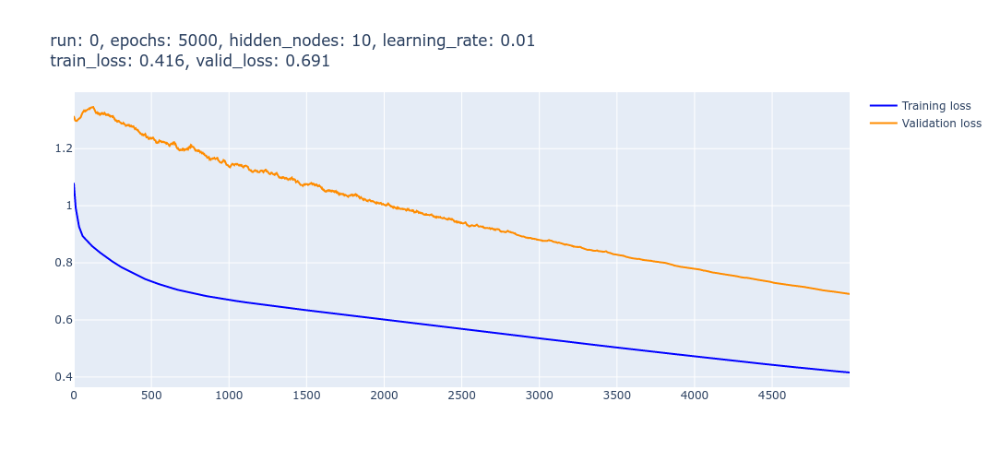

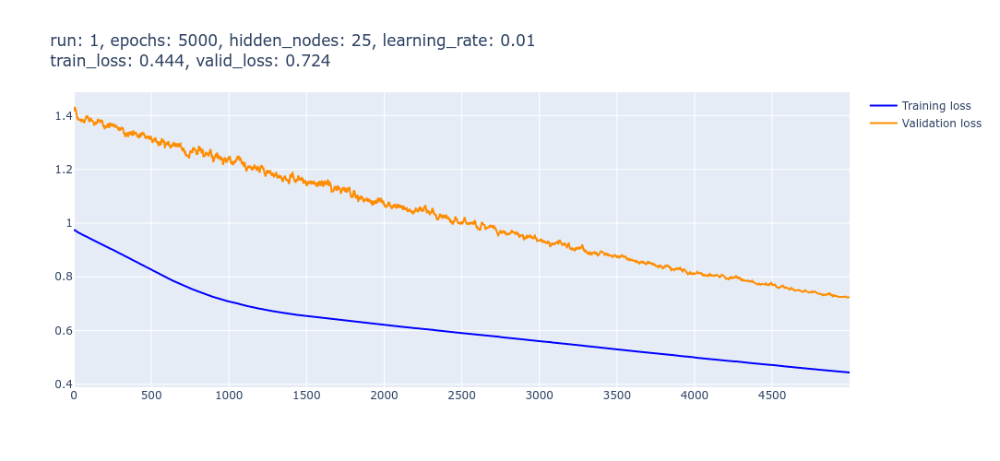

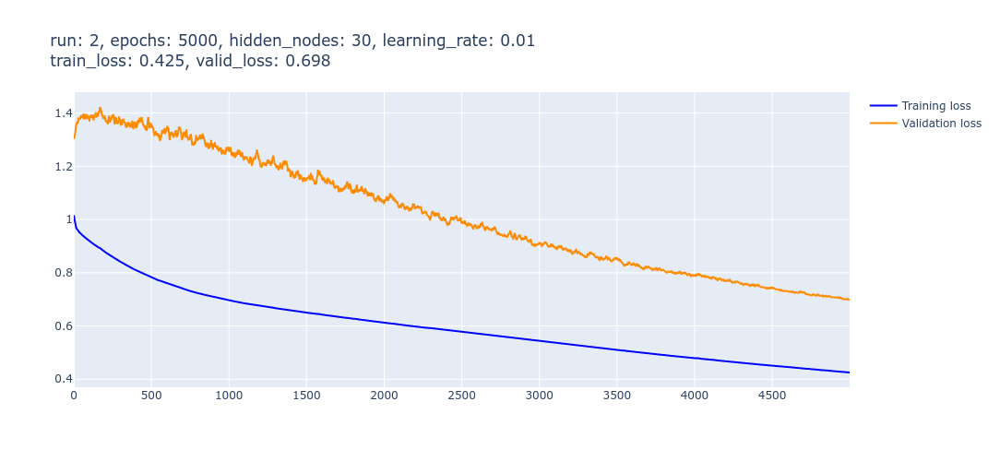

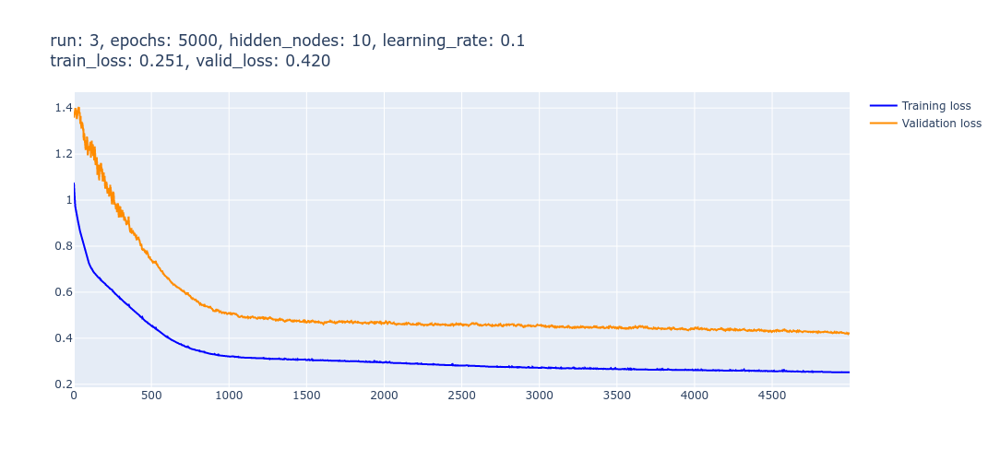

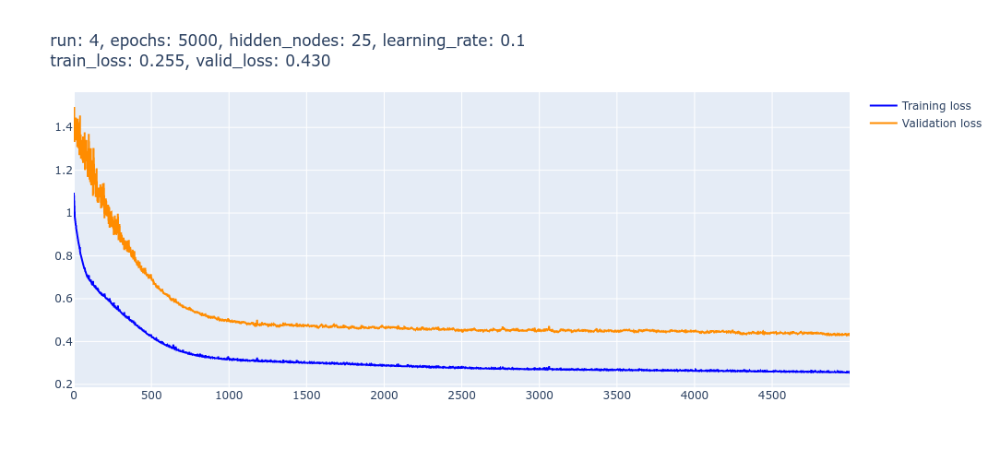

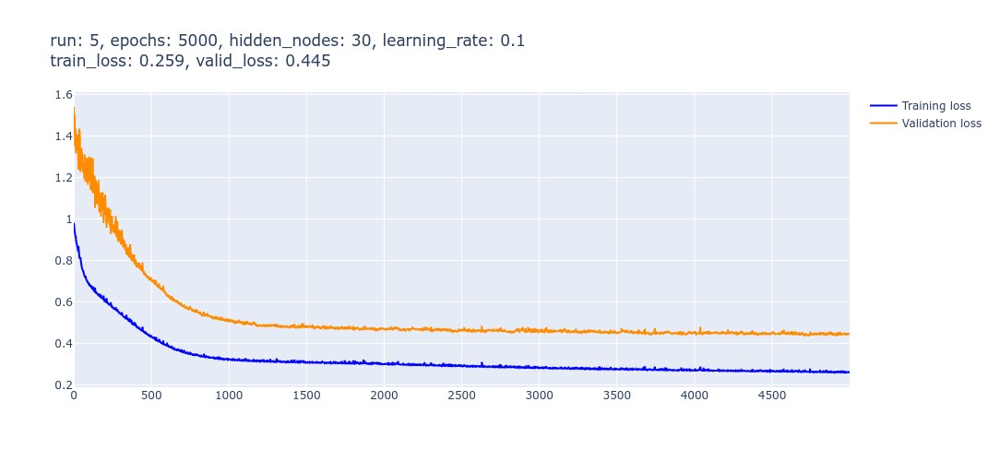

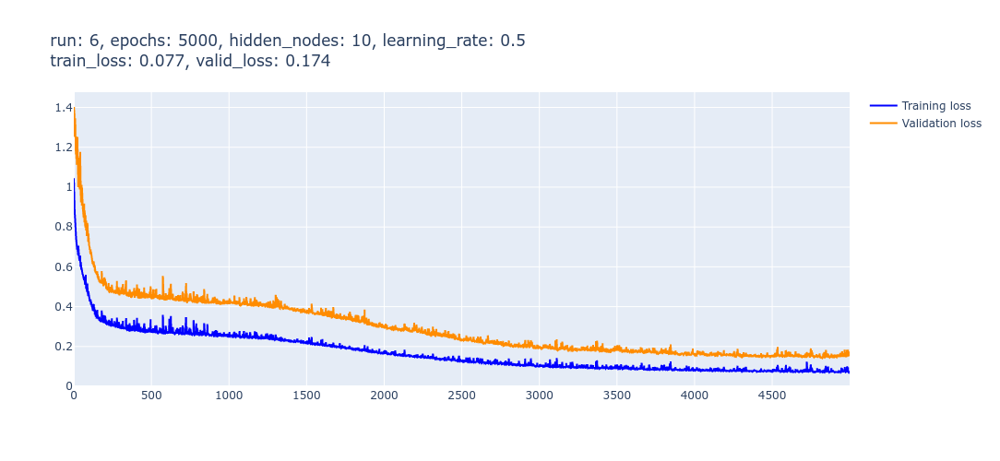

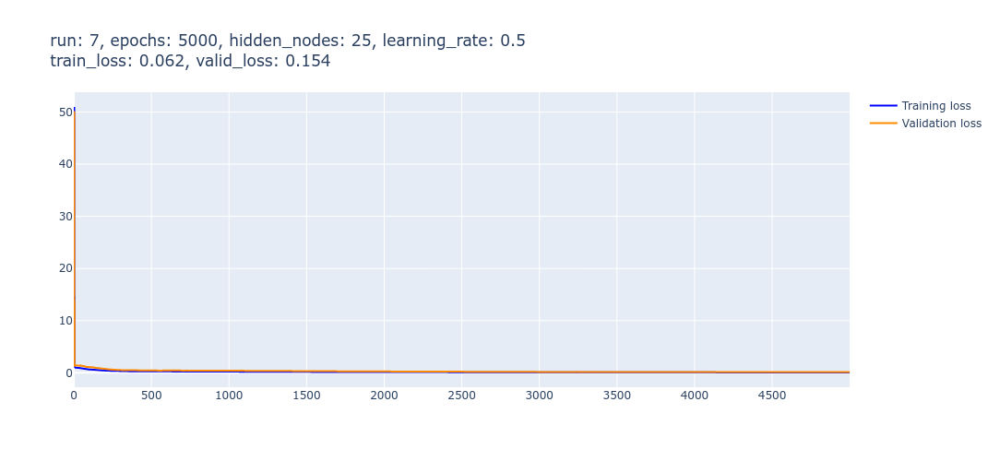

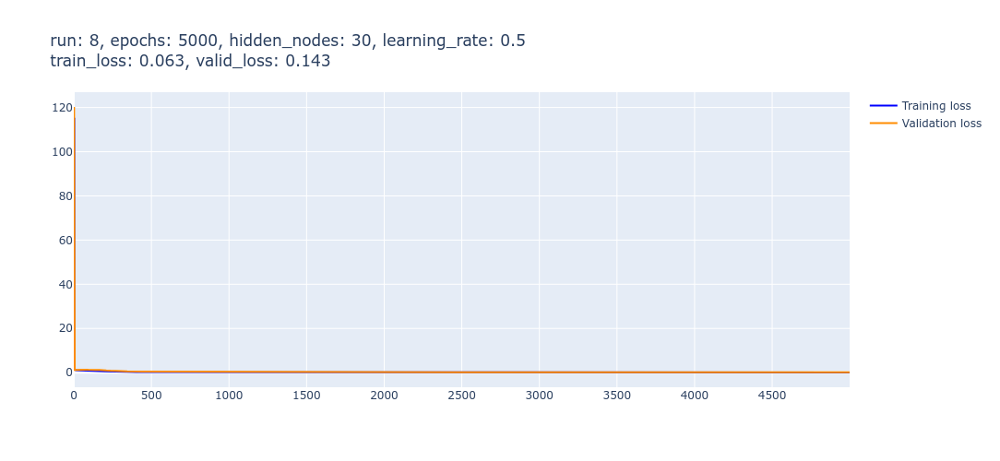

In [15]:
# Print hyperparameter search results (charts of loss)

def plot_run_losses(df_runs) -> None:

    for index, row in df_runs.iterrows():
        
        fig = go.Figure()
    
        # y-axis values
        
        train_losses = row["train_losses"]
        valid_losses = row["valid_losses"]
    
        # x-axis values (list of epochs, starting at 0)
        
        n = len(train_losses)
        x = [ i for i in range(n) ]
        
        # Traces

        trace = go.Scatter(x=x, y=train_losses, mode="lines", name="Training loss", line_color="blue")
        fig.add_trace(trace)
    
        trace = go.Scatter(x=x, y=valid_losses, mode="lines", name="Validation loss", line_color="darkorange")
        fig.add_trace(trace)
        
        # Figure
        
        figure_title =  "run: " + str(index)
        figure_title += ", epochs: " + str(row["epochs"])
        figure_title += ", hidden_nodes: " + str(row["hidden_nodes"])
        figure_title += ", learning_rate: " + str(row["learning_rate"])
        figure_title += "<br>"
        figure_title += "train_loss: " + format(row["train_losses"][-1], ".3f")
        figure_title += ", valid_loss: " + format(row["valid_losses"][-1], ".3f")
    
        fig.layout.title = figure_title
        fig.layout.width = 600
        fig.layout.height = 500
    
        fig.show()
    

plot_run_losses(df_runs)


In [16]:
# Save selected model to file

# Index of selected model
index = 7

# Selected model
nn = df_runs.loc[index, "nn"]

# Save to file
with open(model_file, "wb") as f:
    pickle.dump(nn, f)


# Testing

In [17]:
# Load saved model

with open(model_file, "rb") as f:
    nn = pickle.load(f)
    
print(nn)    

In [18]:
# Perform predictions on testing dataset
#
# Note: nn outputs are scaled

predictions = nn.run(df_test_features)

print(predictions[:10])


[[-0.07207024]
 [-0.44060552]
 [-0.91743206]
 [-0.81355378]
 [-0.85038862]
 [-1.08931609]
 [-0.92380016]
 [-0.96798874]
 [-0.19863165]
 [ 1.30722764]]


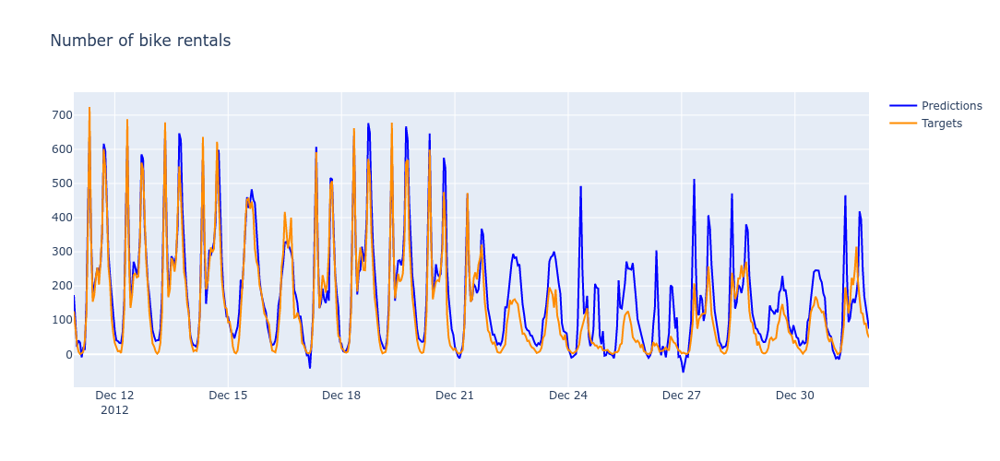

In [20]:
# Plot predictions

test_indices = df_test_targets.index
timestamps = get_timestamps_from_df_data(df_data.iloc[test_indices])

plot_predictions(predictions, MEANS, STDS, timestamps, df_test_targets)    
